<a href="https://colab.research.google.com/github/IvanLopesGit/VAD_DataVis_Final/blob/main/vad_capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dataset: https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset

Equipe: 
      
      
      - Ivan Lopes Alonso - ila@cesar.school      
      - Vitor Padilha Borba Pessoa Guerra - vpbpg@cesar.school


#Dicionário

| Coluna | Descrição | Valores |
|---|---|---|
|track_id| The Spotify ID for the track |
|artists| The artists' names who performed the track. <br />If there is more than one artist, they are separated by a ;|
|album_name| The album name in which the track appears |
|track_name| Name of the track
|popularity| The popularity is calculated by algorithm and is based, <br /> in the most part, on the total number of plays the track has had and how recent those plays are. | 0 to 100 (100 = Best)
|duration_ms| The track length in milliseconds
|explicit| Whether or not the track has explicit lyrics |(true = yes it does; false = no it does not OR unknown)
|danceability| Danceability describes how suitable a track is for dancing based on a combination of musical elements including <br />tempo, rhythm stability, beat strength, and overall regularity. | 0.0 is least danceable and 1.0 is most danceable
|energy| Energy represents a perceptual measure of intensity and activity. <br />Typically, energetic tracks feel fast, loud, and noisy.<br /> For example, death metal has high energy, while a Bach prelude scores low on the scale | 0 = low energy; 1.0 = high energy
|key| The key the track is in. Integers map to pitches using standard Pitch Class notation. | 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1
|loudness| The overall loudness of a track in decibels (dB)
|mode| Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. | Major is represented by 1 and minor is 0
|speechiness| Speechiness detects the presence of spoken words in a track. | The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), <br />the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. <br /> Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. <br />Values below 0.33 most likely represent music and other non-speech-like tracks
|acousticness| A confidence measure from 0.0 to 1.0 of whether the track is acoustic. | 1.0 represents high confidence the track is acoustic
|instrumentalness| Predicts whether a track contains no vocals.<br /> "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". | The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content
|liveness| Detects the presence of an audience in the recording. <br />Higher liveness values represent an increased probability that the track was performed live. <br />A value above 0.8 provides strong likelihood that the track is live
|valence| A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. |Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)
|tempo| The overall estimated tempo of a track in beats per minute (BPM). <br />In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration
|time_signature| An estimated time signature.<br /> The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). |The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.
|track_genre| The genre in which the track belongs

#Bibliotecas e setup

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
from google.colab import drive
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from ydata_profiling.config import Dataset
from ydata_profiling.utils.cache import cache_file

In [ ]:
df.track_genre.value_counts()

acoustic             1000
punk-rock            1000
progressive-house    1000
power-pop            1000
pop                  1000
                     ... 
folk                 1000
emo                  1000
electronic           1000
electro              1000
world-music          1000
Name: track_genre, Length: 114, dtype: int64

# Pandas Profilling

Utilizamos o pandas profilling para obter uma visão geral do dataset: quantidade de linhas, colunas com valores nulos, possiveis correlações, etc.

In [ ]:
profile = ProfileReport(df, title="Spotify Music", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Generos mais populares em media

In [ ]:
media_genero = df.groupby('track_genre').mean()

In [ ]:
genero_popular = media_genero.sort_values('popularity', ascending=False)
print('Os {} generos mais populares são {}'.format(len(genero_popular[0:5]),(genero_popular.index.values[0:5])))

Os 5 generos mais populares são ['pop-film' 'k-pop' 'chill' 'sad' 'grunge']


#Limpeza inicial


In [ ]:
df.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [ ]:
#removendo colunas que não serão utilizadas 
df = df.drop(['Unnamed: 0','key','mode','tempo','time_signature','loudness'],axis=1)

#criando segundo df para substituir e categorizar valores nas colunas
sub_df = df.copy()

Músicas com popularidade 0 são musicas que não foram tocadas nem mesmo uma vez no período de análise do dataset e devem, portanto, serem removidas do Acervo do aplicativo (dataset)

In [ ]:
df= df.drop(df[df.popularity==0].index)

#1ª Analise Exploratória: músicas populares similares

Perguntas que pretendemos responder com essa analise: 
1. Quais os gêneros mais populares?
2. Quais características das músicas apresentam relação mais forte com a popularidade?
3. Em um gênero específico, o que faz ele ser mais popular?

In [ ]:
#Conversão do gênero de volta pra coluna com o top 5
media_genero = df.groupby('track_genre').mean()
df1 = media_genero.sort_values('popularity', ascending = False).head(5)
df1.reset_index(inplace=True)
df1

,track_genre,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence
0,pop-film,59.401804,279741.055110,0.001002,0.597117,0.604308,0.063796,0.440667,0.008140,0.166303,0.529242
1,k-pop,59.204995,253482.944849,0.019771,0.640422,0.678770,0.084856,0.298486,0.009780,0.178473,0.563108
2,pop,58.161369,223594.191932,0.073350,0.632260,0.606142,0.080460,0.350714,0.005659,0.157133,0.502602
3,electro,57.905297,194520.834671,0.184591,0.650937,0.652485,0.081459,0.235948,0.042781,0.182916,0.453981
4,house,57.212730,193547.907873,0.130653,0.667605,0.740429,0.068328,0.119598,0.048611,0.184179,0.469015


In [ ]:
#Geração do dataframe com o top 5 gêneros

popfilm = df[df['track_genre']=='pop-film']
kpop = df[df['track_genre']=='k-pop']
pop = df[df['track_genre']=='pop']
electro = df[df['track_genre']=='electro']
house = df[df['track_genre']=='house']

df_top5 = pd.concat([popfilm,kpop, pop, electro, house], ignore_index=True)

df_top5

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
0,3yV2c3cYhkAwSsxAq6nRiv,Gajendra Verma,Table No. 21 (Original Motion Picture Soundtrack),Mann Mera,74,200120,False,0.535,0.765,0.0444,0.05400,0.000000,0.0921,0.3730,pop-film
1,6pzlnyHTVYi5FOmrgOmC95,Arijit Singh,Kedarnath,Jaan 'Nisaar (Arijit),71,238369,False,0.481,0.392,0.0246,0.47800,0.000000,0.1220,0.2570,pop-film
2,6zAvNLJkdyRApUHnlJjKfO,Ali Zafar,Jhoom,Jhoom - R&B Mix,73,298986,False,0.662,0.400,0.0548,0.73500,0.000017,0.0863,0.6170,pop-film
3,56zZ48jdyY2oDXHVnwg5Di,Arijit Singh,Aashiqui 2,Tum Hi Ho,71,261974,False,0.528,0.449,0.0250,0.78500,0.000000,0.1220,0.3170,pop-film
4,0XwRlvv3KlOu4HWlOH34XG,Diljit Dosanjh,MoonChild Era,Lover,71,190000,False,0.827,0.587,0.1130,0.20300,0.000000,0.0727,0.7740,pop-film
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3992,6uTCim4OGFZOauCqHWIpu9,Fedde Le Grand;Robert Falcon;Sofia Quinn,Heaven (feat. Sofia Quinn) [Club Mix],Heaven (feat. Sofia Quinn) - Club Mix,68,175773,False,0.703,0.963,0.0515,0.00477,0.016900,0.3040,0.0301,house
3993,3W4BmmQVuhF8rBUQY3Ga41,Purple Disco Machine;Sophie and the Giants,Exotica (Deluxe),In the Dark,60,185564,False,0.696,0.770,0.0496,0.04530,0.000041,0.0812,0.7750,house
3994,6QzdmoHqSH08FOq18fxqKd,Bicep,Tsugi Chill-Out,Atlas,1,348306,False,0.545,0.792,0.0320,0.10000,0.952000,0.1730,0.1270,house
3995,1lrUQn3fJDL2DqDf1EccbZ,Disciples,House Anthems,On My Mind,3,185493,False,0.745,0.845,0.0450,0.08260,0.000033,0.0577,0.7830,house


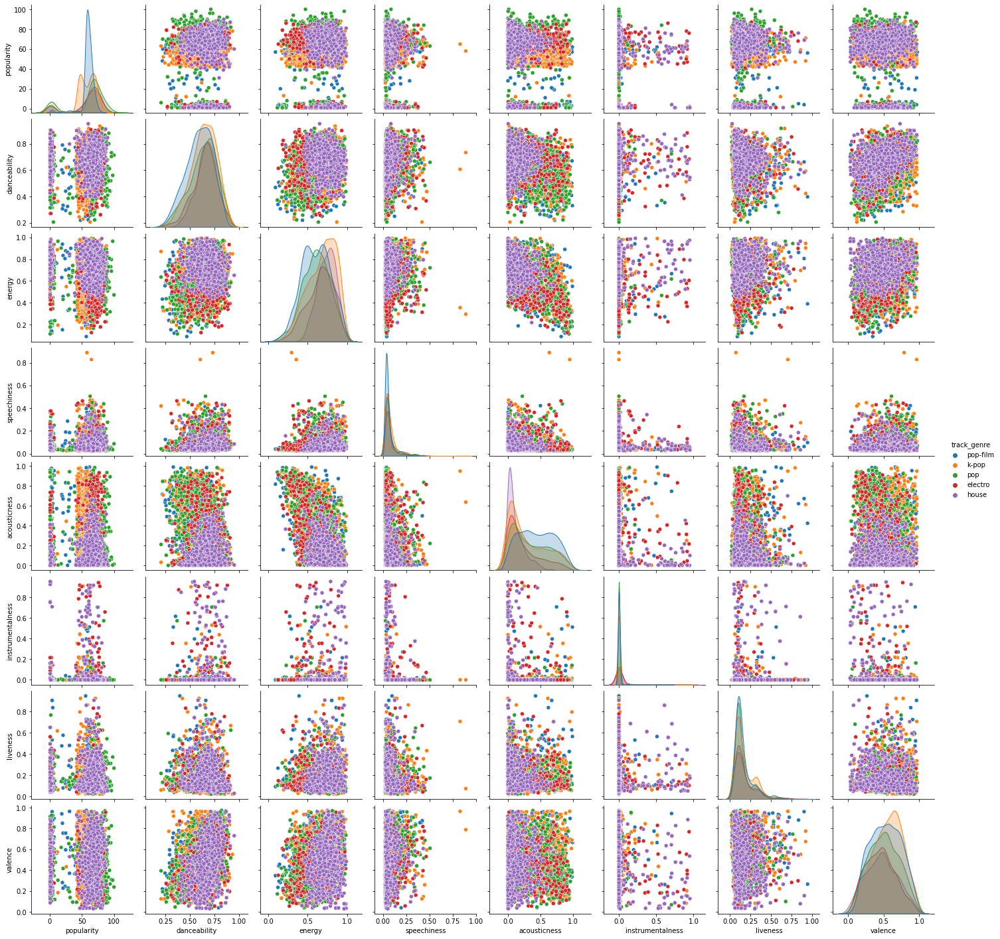

In [ ]:
#Pair plot para analise de correlação
col=['popularity', 'danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence','track_genre']

sns.pairplot(df_top5[col],hue='track_genre')

In [ ]:
#Validação de popularidade do gênero musical com o tipo de música ser dançável

fig = px.histogram(df_top5, x='danceability', y='popularity', color='track_genre', barmode="group",  
                   title = "Popularidade X Música Dançável")
fig.update_layout(title_x = 0.5, xaxis_title = "Dançável", yaxis_title = "Popularidade")
fig.show()

Text(0.5, 1.1, 'Correlação da Popularidade e Outras variaveis no estilo house')

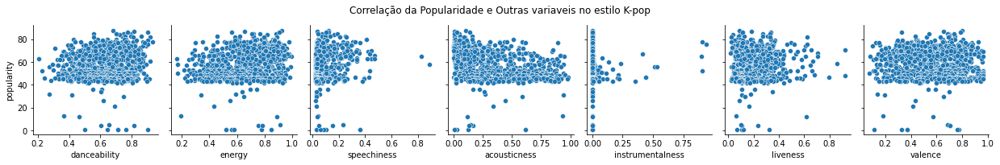

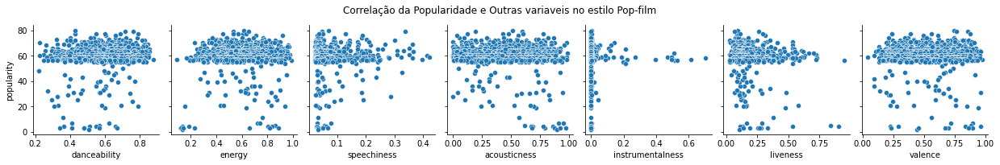

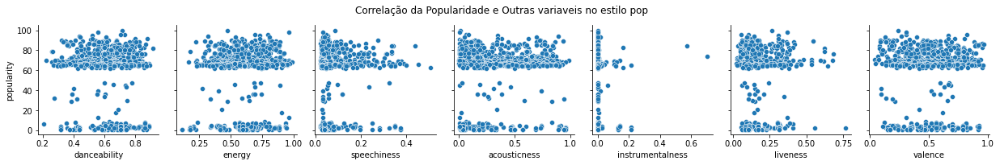

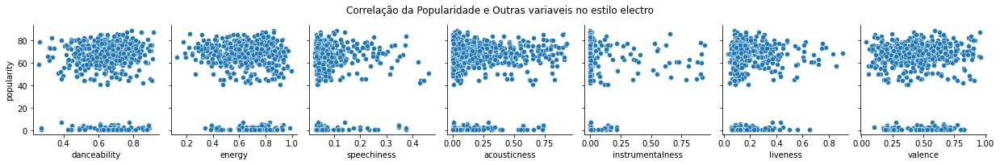

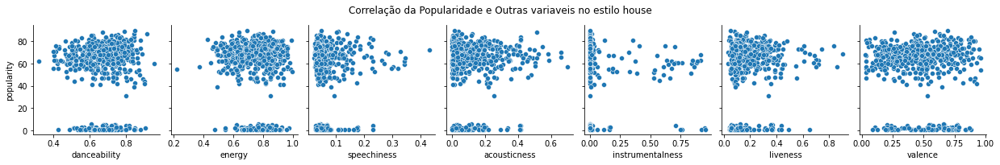

In [ ]:
kpop_fig = sns.pairplot(kpop,y_vars='popularity',x_vars=('danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence'))
kpop_fig.fig.suptitle('Correlação da Popularidade e Outras variaveis no estilo K-pop', y=1.1)

popfilm_fig = sns.pairplot(popfilm,y_vars='popularity',x_vars=('danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence'))
popfilm_fig.fig.suptitle('Correlação da Popularidade e Outras variaveis no estilo Pop-film', y=1.1)

pop_fig = sns.pairplot(pop,y_vars='popularity',x_vars=('danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence')) 
pop_fig.fig.suptitle('Correlação da Popularidade e Outras variaveis no estilo pop', y=1.1)

electro_fig = sns.pairplot(electro,y_vars='popularity',x_vars=('danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence'))
electro_fig.fig.suptitle('Correlação da Popularidade e Outras variaveis no estilo electro', y=1.1)

house_fig = sns.pairplot(house,y_vars='popularity',x_vars=('danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence'))
house_fig.fig.suptitle('Correlação da Popularidade e Outras variaveis no estilo house', y=1.1)


In [ ]:
#Visualização entre os gêneros top 5, quais os ritmos mais presentes entre "Dança, Energia e Instrumentos" 
#É possível notar que os gêneros mais escutados tem relação com o ritmo de Dança e Energia

fig = px.scatter_ternary(df_top5, a="danceability", b="energy", c="instrumentalness",
    color="track_genre", size='popularity',
    title = "Relevância entre gêneros musicais e os ritmos mais presentes",
    labels={"danceability": "Dança", "energy": "Energia", "instrumentalness": "Instrumental"},)
fig.update_layout(title_x = 0.5)

fig.show()                   

ol=['popularity', 'danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence','track_genre']

In [ ]:
df.popularity.describe()

count    97980.000000
mean        38.673127
std         19.201246
min          1.000000
25%         23.000000
50%         39.000000
75%         53.000000
max        100.000000
Name: popularity, dtype: float64

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



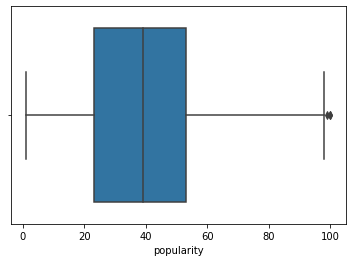

In [ ]:
#popularidade
sns.boxplot(df.popularity)


In [ ]:
# analise de popularidade maior que 60:
# apenas 25% (top 75%) das musicas avaliadas tem popularidade acima de 53,
# focaremos 60 como uma nota minima de popularidade para uma boa aceitação 
pop60= df[df.popularity>=60]

In [ ]:
pop60.describe()

,popularity,duration_ms,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence
count,14822.000000,1.482200e+04,14822.000000,14822.000000,14822.000000,14822.000000,14822.000000,14822.000000,14822.000000
mean,68.378829,2.187992e+05,0.594513,0.646194,0.076238,0.268172,0.072558,0.180044,0.482363
std,6.902611,6.458207e+04,0.160498,0.224344,0.075264,0.296378,0.214397,0.138965,0.234419
min,60.000000,4.000000e+04,0.000000,0.000020,0.000000,0.000001,0.000000,0.018200,0.000000
25%,63.000000,1.785610e+05,0.493000,0.500000,0.034900,0.020900,0.000000,0.095400,0.300000
50%,67.000000,2.105530e+05,0.606000,0.682000,0.047600,0.138000,0.000009,0.124000,0.472000
75%,73.000000,2.473075e+05,0.713000,0.824000,0.080300,0.455000,0.002280,0.223750,0.661000
max,100.000000,1.025280e+06,0.980000,0.998000,0.828000,0.996000,1.000000,0.981000,0.992000


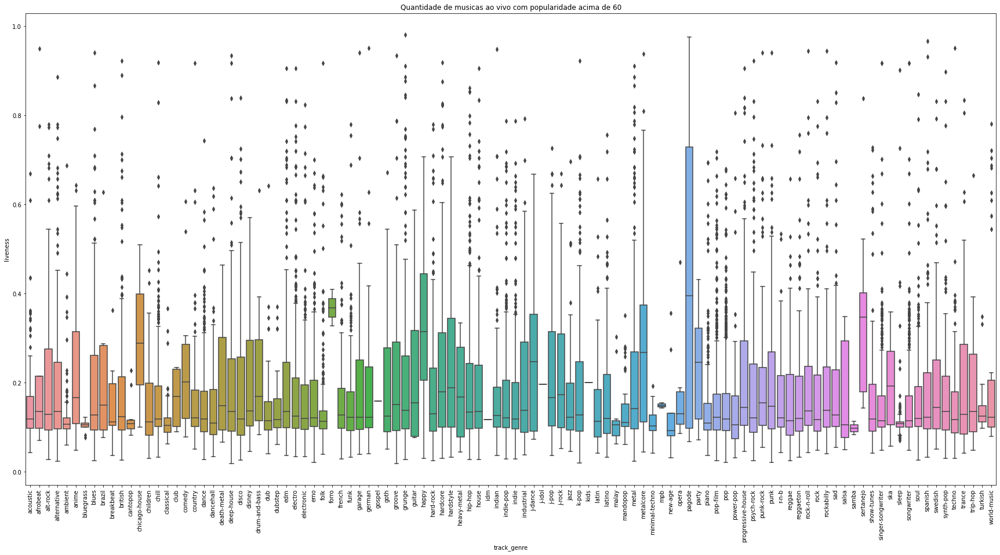

In [ ]:
plt.figure(figsize=(30,15))

pop60_live=sns.boxplot(y=pop60.liveness, x=pop60.track_genre)
plt.title('Distribuição de musicas ao vivo com popularidade acima de 60')
plt.xticks(rotation=90)
plt.show()

A vasta maioria das músicas com popularidade acima de 60 não foi gravada em shows ao vivo (com participação do público - liveness). Então músicas com baixos niveis de Liveness devem ser dadas preferência ao considerar recomendações. 

A exceção a essa regra fica por conta dos estilos FORRO, PAGODE e SERTANEJO onde podemos observar uma grande quantidade de musícas com participação da platéia.

Isso reflete bastante o gosto da população brasileira, tendo em vista que esses são ritmos que tem alta repercussão nacional. 


- Recomendações: 
--  para ritmos internacionais: músicas com baixos níveis de liveness
-- para ritmos nacionais: altos níveis de liveness

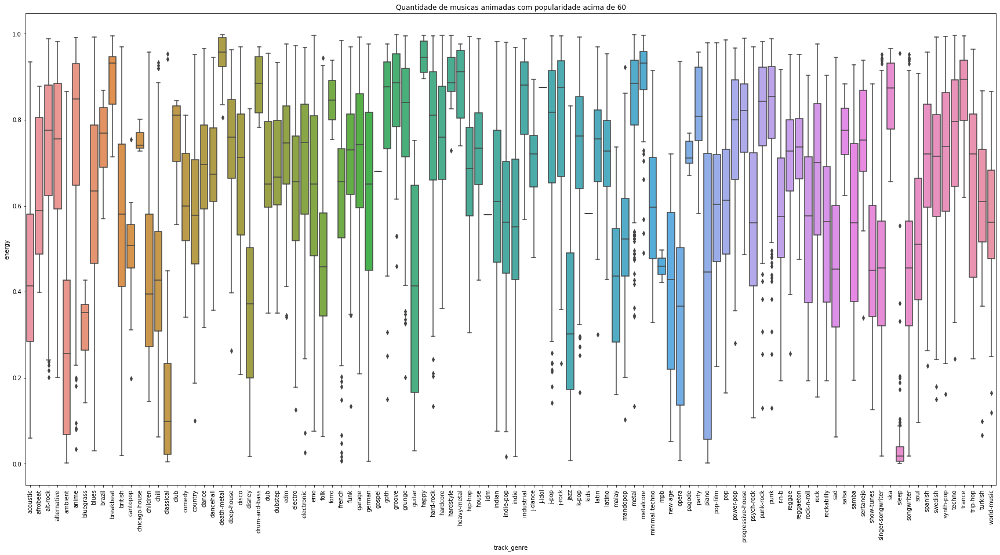

In [ ]:
plt.figure(figsize=(30,15))

pop60_energy=sns.boxplot(y=pop60.energy, x=pop60.track_genre)
plt.title('Distribuição de musicas animadas com popularidade acima de 60')
plt.xticks(rotation=90)
plt.show()

Desse gráfico podemos observar que a grande maioria das musicas com popularidade acima de 60 são musícas animadas, que passam a sensação de energia alta. 

O grande destaque dessa avaliação fica por conta do gênero "sleep" que tem uma baixissima animação, o que, convenhamos, não é nenhuma surpresa ja que ele é utilizado para relaxar e induzir o sono.

Alguns estilo como HAPPY, DEATH-METAL e FORRO são o polo oposto desse gráfico, onde suas músicas são encontradas somente com alta animação 

# 2ª análise: Promoção das músicas impopulares


In [ ]:
sub_df.describe()

,popularity,duration_ms,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,0.084652,0.314910,0.156050,0.213553,0.474068
std,22.305078,1.072977e+05,0.173542,0.251529,0.105732,0.332523,0.309555,0.190378,0.259261
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,0.035900,0.016900,0.000000,0.098000,0.260000
50%,35.000000,2.129060e+05,0.580000,0.685000,0.048900,0.169000,0.000042,0.132000,0.464000
75%,50.000000,2.615060e+05,0.695000,0.854000,0.084500,0.598000,0.049000,0.273000,0.683000
max,100.000000,5.237295e+06,0.985000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000


Faremos a substituição/categorização dos valores em cada coluna para o seguinte critério: 



* 81-100% : A

* 61-80% : B

* 41-60% : C

* 21-40% : D

* 0-20% : E



In [ ]:
#Transformando os valores das colunas em int
sub_df[['danceability','energy','speechiness','acousticness','instrumentalness','liveness','valence']]=round(sub_df[['danceability','energy','speechiness','acousticness','instrumentalness','liveness','valence']]*100,ndigits=None).astype(int)

#Substituindo os valores por letras, conforme graduação acima
sub_df[['popularity','danceability','energy','speechiness','acousticness','instrumentalness','liveness','valence']]=sub_df[['popularity','danceability','energy','speechiness','acousticness','instrumentalness','liveness','valence']].replace({range(0,20):'E',range(20,40):'D',range(40,60):'C',range(60,80):'B',range(80,101):'A'})

In [ ]:
sub_df.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,B,230666,False,B,C,E,E,E,D,B,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,C,149610,False,C,E,E,A,E,E,D,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,C,210826,False,C,D,E,D,E,E,E,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,B,201933,False,D,E,E,A,E,E,E,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,A,198853,False,B,C,E,C,E,E,E,acoustic


TOP 5

1º - pop-film

2º - k-pop

3º - chill

4º - sad 

5º - grunge

## 1ª Recomendação

Recomendações de músicas e artistas semelhantes ao gênero do top 5 e que também possuem a popularidade A, levando em consideração as caracteristicas da música dança e energética, as quais são bem presentes nas caracteristicas do top 5.

In [ ]:
df_pop = sub_df[(sub_df['popularity'] == 'A') & (sub_df['energy'] == 'A') & (sub_df['danceability'] == 'A')]

df_pop


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
9000,6GomT970rCOkKAyyrwJeZi,Öwnboss;Sevek,Move Your Body,Move Your Body,A,157444,False,A,A,E,E,E,E,D,brazil
20028,7JJmb5XwzOO8jgpou264Ml,Shawn Mendes,Illuminate (Deluxe),There's Nothing Holdin' Me Back,A,199440,False,A,A,E,D,E,E,A,dance
20410,4C6Uex2ILwJi9sZXRdmqXp,Nicki Minaj,Super Freaky Girl,Super Freaky Girl,A,170977,True,A,A,D,E,E,D,A,dance
20419,7fZBQnc0zXwVybgCIrQQil,Imanbek;BYOR,Belly Dancer,Belly Dancer,A,151475,False,A,A,E,E,E,E,C,dance
20924,2yjlYDiNiQkdxVqTlaSrlX,Nicki Minaj,Queen Radio: Volume 1,Super Freaky Girl,A,170977,True,A,A,D,E,E,D,A,dance
30120,7fZBQnc0zXwVybgCIrQQil,Imanbek;BYOR,Belly Dancer,Belly Dancer,A,151475,False,A,A,E,E,E,E,C,edm
30457,6GomT970rCOkKAyyrwJeZi,Öwnboss;Sevek,Move Your Body,Move Your Body,A,157444,False,A,A,E,E,E,E,D,edm
30572,4cG7HUWYHBV6R6tHn1gxrl,Riton;Nightcrawlers;Mufasa & Hypeman;Dopamine,Friday (feat. Mufasa & Hypeman) [Dopamine Re-E...,Friday (feat. Mufasa & Hypeman) - Dopamine Re-...,A,169153,False,A,A,E,E,E,D,A,edm
31115,7fZBQnc0zXwVybgCIrQQil,Imanbek;BYOR,Belly Dancer,Belly Dancer,A,151475,False,A,A,E,E,E,E,C,electro
37051,4LwU4Vp6od3Sb08CsP99GC,Dr. Dre;Snoop Dogg,2001,The Next Episode,A,161506,True,A,A,D,E,E,E,D,funk



Recomendando 5 músicas aleatórias, seguindo os padrões de pesquisa acima.

In [ ]:
df_pop.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
30457,6GomT970rCOkKAyyrwJeZi,Öwnboss;Sevek,Move Your Body,Move Your Body,A,157444,False,A,A,E,E,E,E,D,edm
89658,6DoL1yYIwEW7VZMRaJhoJI,Chris Jedi;Anuel AA;Chencho Corleone;Ñengo Flow,La Llevo Al Cielo (Ft. Ñengo Flow),La Llevo Al Cielo (Ft. Ñengo Flow),A,254920,True,A,A,E,E,E,E,B,reggaeton
81354,3rmo8F54jFF8OgYsqTxm5d,Ed Sheeran,=,Bad Habits,A,230746,False,A,A,E,E,E,D,C,pop
67801,79HZAZNnOE97rb2hnI0XQr,Rauw Alejandro;Lyanno;Brray,LOKERA,LOKERA,A,195294,False,A,A,E,D,E,E,C,latin
88652,4tYFy8ALRjIZvnvSLw5lxN,Bad Bunny;Rauw Alejandro,Un Verano Sin Ti,Party,A,227628,False,A,A,E,E,E,D,C,reggae


Simulação se baseando na seleção do usuário por gênero e exibindo 5 resultados seguindo os padrões de pesquisa acima.


In [ ]:
selected = df_pop[(df_pop['track_genre'] == 'latino')]

selected.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
68308,228BxWXUYQPJrJYHDLOHkj,Daddy Yankee,Barrio Fino (Bonus Track Version),Gasolina,A,192600,False,A,A,E,D,E,E,B,latino
68553,4tYFy8ALRjIZvnvSLw5lxN,Bad Bunny;Rauw Alejandro,Un Verano Sin Ti,Party,A,227628,False,A,A,E,E,E,D,C,latino
68663,6DoL1yYIwEW7VZMRaJhoJI,Chris Jedi;Anuel AA;Chencho Corleone;Ñengo Flow,La Llevo Al Cielo (Ft. Ñengo Flow),La Llevo Al Cielo (Ft. Ñengo Flow),A,254920,True,A,A,E,E,E,E,B,latino
68721,48AJSd42lXpicsGqcgopof,Daddy Yankee;Bad Bunny,LEGENDADDY,X ÚLTIMA VEZ,A,192477,True,A,A,E,E,E,E,C,latino
68724,6ojZtz3sZr6ynvejLOqgCj,Tiago PZK;Ozuna,Nos Comemos (feat. Ozuna),Nos Comemos (feat. Ozuna),A,191086,True,A,A,E,E,E,E,C,latino


## 2ª Recomendação

Recomendações de músicas e artistas semelhantes ao gênero do top 5 e que também possuem a popularidade B, levando em consideração as caracteristicas da música dança e energética, as quais são bem presentes nas caracteristicas do top 5.

In [ ]:
df_pop = sub_df[(sub_df['popularity'] == 'B') & (sub_df['energy'] == 'A') & (sub_df['danceability'] == 'A')]

df_pop


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
1100,1q8NdCAQ9QUjpYiqzdd3mv,Calle 13,Calle 13 (Explicit Version),Atrévete-Te-Te,B,239306,True,A,A,E,E,E,B,A,afrobeat
3510,4se25yP3bMpaMAlcxvyJ5Q,Cookiee Kawaii;Dear Silas,Vanice,Violin,B,109714,True,A,A,E,E,E,E,B,alternative
4051,2aJDlirz6v2a4HREki98cP,Bicep,Bicep,Glue,B,269149,False,A,A,E,E,A,E,C,ambient
9451,1JyQVDd48BprQrdEOpmodT,Dubdogz;Liu;Dubdisko,Dancing,Dancing,B,162459,False,A,A,E,E,E,E,C,brazil
14000,5ygDXis42ncn6kYG14lEVG,Pinkfong,Pinkfong Animal Songs,Baby Shark,B,80927,False,A,A,E,D,E,E,B,children
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109112,5D1zGVDJTOqwaGSzYw5TtP,Duke Dumont;Shaun Ross,"Red Light Green Light (For Club Play Only, Pt. 6)","Red Light Green Light - For Club Play Only, Pt. 6",B,211208,False,A,A,E,E,C,E,A,techno
109181,5krhFNgUcYHwXlNPJJYzFM,Ewan McVicar,Tell Me Something Good,Tell Me Something Good,B,249678,False,A,A,E,E,A,D,A,techno
109234,3pEuO9J2MTEmec8kUfYYvl,Real McCoy,Another Night,Another Night,B,236933,False,A,A,E,E,E,E,A,techno
109240,7aEivHwZvqNHoqsXoNKcWL,Tiga;Tiësto,Mind Dimension (Tiësto Remix),Mind Dimension - Tiësto Remix,B,220952,False,A,A,E,E,C,E,E,techno



Recomendando 5 músicas aleatórias, seguindo os padrões de pesquisa acima.

In [ ]:
df_pop.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
88457,22x5EpcJkfE3SHBONJG6FS,CHEHON,BEST,韻波句徒,B,291440,False,A,A,E,C,E,E,A,reggae
21340,4kOTDj4SiZPkW1p96WMDNv,Sean Paul,The Trinity,We Be Burnin',B,213066,False,A,A,E,E,E,E,A,dancehall
81785,4c8erEn1DjLoDp0CRLkNnq,Jasleen Royal;Harshdeep Kaur;Siddharth Mahadevan,Baar Baar Dekho (Original Motion Picture Sound...,Nachde Ne Saare,B,194761,False,A,A,E,B,E,E,A,pop
30528,67awxiNHNyjMXhVgsHuIrs,DJ Snake;Lil Jon,Turn Down for What,Turn Down for What,B,213733,False,A,A,E,E,E,E,E,edm
51234,5OotwkHgMpNYfsCwAOs4jP,Anirudh Ravichander;Jonita Gandhi,Don (Original Motion Picture Soundtrack),Private Party,B,216774,False,A,A,E,E,E,E,A,hip-hop


Simulação se baseando na seleção do usuário por gênero e exibindo 5 resultados seguindo os padrões de pesquisa acima.


In [ ]:
selected = df_pop[(df_pop['track_genre'] == 'k-pop')]

selected.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
65305,7eVu7FI02cTicLEgVtUvwF,TAEYONG;JENO;HENDERY;YANGYANG;GISELLE,2021 Winter SMTOWN : SMCU EXPRESS,ZOO,B,177413,False,A,A,E,E,E,E,B,k-pop
65170,308Ir17KlNdlrbVLHWhlLe,TWICE,Formula of Love: O+T=<3,The Feels,B,198053,False,A,A,E,E,E,E,A,k-pop
65267,4pspYVQGFHLPEFgQPD1J7e,ITZY,IT'z ME,WANNABE,B,191242,False,A,A,E,E,E,E,B,k-pop
65875,4cTSnpyaIR1qGaTOLJunDM,BTS,Wings,BTS Cypher 4,B,294463,False,A,A,E,E,E,E,D,k-pop
65951,4fsQ0K37TOXa3hEQfjEic1,LE SSERAFIM,ANTIFRAGILE,ANTIFRAGILE,B,184444,False,A,A,E,E,E,E,A,k-pop


## 3ª Recomendação

Recomendações de músicas e artistas semelhantes ao gênero do top 5 e que também possuem a popularidade C, levando em consideração as caracteristicas da música dança e energética, as quais são bem presentes nas caracteristicas do top 5.

In [ ]:
df_pop = sub_df[(sub_df['popularity'] == 'C') & (sub_df['energy'] == 'A') & (sub_df['danceability'] == 'A')]

df_pop


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
1300,6Pg4rb8siscryBP7et3wbX,BaianaSystem;Tropkillaz,Saci (Remix),Saci (Remix),C,183779,False,A,A,E,E,E,E,B,afrobeat
1307,21s0bjVrP7RtQskeUKZxOu,Manu Dibango,Manu Dibango Anthology,Soul Makossa,C,264306,False,A,A,E,E,E,E,A,afrobeat
2321,1ABzvnkHLpLaIN7VlB00LJ,Kinky,Kinky (Remastered),Soun Tha Mi Primer Amor - Remastered,C,191000,False,A,A,E,E,C,E,A,alt-rock
3486,1ABzvnkHLpLaIN7VlB00LJ,Kinky,Kinky (Remastered),Soun Tha Mi Primer Amor - Remastered,C,191000,False,A,A,E,E,C,E,A,alternative
4769,0wQzxQq64FY736IRPxgYj9,Bicep,Water,Glue,C,269149,False,A,A,E,E,A,E,C,ambient
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112223,3yQCp4qxlnvi4e3q4Pbhp2,Şehinşah,Denetimli Serbestlik Stili (Deluxe),İstila,C,226092,True,A,A,E,E,E,E,E,turkish
112282,70yTGo4j6gMh3MpbTZP5ZS,Ati242;Massaka,DIPSOMANIA,9 MM,C,191587,True,A,A,D,D,E,E,B,turkish
112289,5429svPuyzL4AvvQUTyPPn,Şehinşah;DJ Artz,DEEV (Deluxe Edition),Hepsi Benim 2 (feat. DJ Artz),C,154736,True,A,A,E,E,E,D,C,turkish
112319,1MRvGeMiQ0gNfQTmP4Kz0G,Hidra,Reptilian,Reptilian,C,150243,False,A,A,E,E,E,E,E,turkish



Recomendando 5 músicas aleatórias, seguindo os padrões de pesquisa acima.

In [ ]:
df_pop.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
10351,3DntGqcE1Xte7kj07s1tY7,Datsik;Excision,Vindicate,Vindicate,C,275454,False,A,A,E,E,B,E,E,breakbeat
60155,7hFZu37rmQxzAp0M1NqJ7P,Tokyo Machine,BUBBLES,BUBBLES,C,230624,False,A,A,E,E,C,E,C,j-dance
35553,63mG44j8KRY1c7Qyqa5w4l,Os Barões Da Pisadinha,Agora Eu Pego Mesmo,Sou Favela,C,162194,False,A,A,E,C,E,E,A,forro
109956,5SB73InpxuEQ20qEWhOQFV,Format:B,Chunky,Chunky,C,158114,False,A,A,E,E,E,E,A,techno
109179,10twrq4TUN6ThYX8fHTlab,Boris Brejcha,Club Vibes Part 02,Bumblebee,C,470400,False,A,A,E,E,A,E,D,techno


Simulação se baseando na seleção do usuário por gênero e exibindo 5 resultados seguindo os padrões de pesquisa acima.


In [ ]:
selected = df_pop[(df_pop['track_genre'] == 'j-dance')]

selected.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
60024,4iSWQ5Eadn5tZvvG9XNzYN,Charly Black,You're Perfect,You're Perfect,C,196973,False,A,A,D,D,E,E,B,j-dance
60155,7hFZu37rmQxzAp0M1NqJ7P,Tokyo Machine,BUBBLES,BUBBLES,C,230624,False,A,A,E,E,C,E,C,j-dance
60754,50Z6FiZ8xBJ0V16BPIsEam,Skeng,Day Break,Day Break,C,113814,True,A,A,E,D,E,E,B,j-dance
60463,2aULMaE3NgcnVluZCvxFmT,Vybz Kartel,The Gaza Don,Summer Tiime,C,167053,False,A,A,E,D,E,D,D,j-dance
60104,0Mg5cbRrpU5VF3tV90hmvk,Skillibeng;Fivio Foreign;French Montana,Whap Whap (feat. Fivio Foreign & French Montana),Whap Whap (feat. Fivio Foreign & French Montana),C,161495,True,A,A,D,D,E,E,B,j-dance


## 4ª Recomendação

Recomendações de músicas e artistas semelhantes ao gênero do top 5 e que também possuem a popularidade D, levando em consideração as caracteristicas da música dança e energética, as quais são bem presentes nas caracteristicas do top 5.

In [ ]:
df_pop = sub_df[(sub_df['popularity'] == 'D') & (sub_df['energy'] == 'A') & (sub_df['danceability'] == 'A')]

df_pop


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
1013,3BGxXQJWeLAEcwNKRFUxYA,BaianaSystem;BNegão,ATO 1: Navio Pirata,Reza Forte,D,232826,False,A,A,E,D,E,E,A,afrobeat
1083,06yiYlbdcanbh4GJEFyhEj,BaianaSystem;BNegão,OXEAXEEXU,Reza Forte,D,232293,False,A,A,E,D,E,E,A,afrobeat
1084,0uWCzZzI1A2yxreko4iEib,Plastilina Mosh,Tasty + B Sides,Human Disco Ball,D,214960,False,A,A,E,E,C,E,A,afrobeat
1110,63TbBqehgYbVYaj7vt7OAf,OQuadro;Dimak,OQuadro,Tá Amarrado,D,232826,False,A,A,E,D,E,E,A,afrobeat
1143,2jR9xbXmW7L5W2qMLQprBy,BaianaSystem,OXEAXEEXU,Chapéu Panamá,D,183706,False,A,A,D,C,E,E,C,afrobeat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111389,4LUllPnGoVQ2SjQXtMilAw,Cut Chemist,The Audience's Listening (U.S. Version),(My 1st) Big Break,D,270626,False,A,A,D,E,D,E,C,trip-hop
112616,3Tzgr29bOgxVSS71bpeoLJ,Kamufle;Contra;Mali Green,RUH,RUH,D,181588,True,A,A,D,E,E,E,D,turkish
112762,48hmCZt8zQ35HPWt3jw7i8,Ceza,BakaBaka,BakaBaka,D,180946,False,A,A,D,D,E,B,B,turkish
112776,3cNw94RcgXmcKw0268eipF,Şehinşah,Denetimli Serbestlik Stili (Deluxe),Dilemma,D,85008,True,A,A,E,E,E,E,B,turkish



Recomendando 5 músicas aleatórias, seguindo os padrões de pesquisa acima.

In [ ]:
df_pop.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
35841,0SXCRGVFT4lLgGrrxIXnpH,Caviar Com Rapadura,Bebo Porque Gosto de Beber - Vol. 11,Somos Loucos,D,212688,False,A,A,E,C,E,E,A,forro
73490,5GeIa7kAYaTaWPVBmlbyiH,Sebo K;Max Moya,Spirits,Spirits - Drum Version,D,476106,False,A,A,E,E,A,E,D,minimal-techno
100906,1DEvcP8uilOusAMyMLB6ew,Tipe-X,Super Surprise,Jangan Jadi Pecundang,D,207546,False,A,A,E,E,E,E,A,ska
30863,4OkD8oWu6iojf76kkk9LiU,Clean Bandit;French The Kid;Rema,Sad Girls (feat. Rema) [Clean Bandit VIP Remix],Sad Girls (feat. Rema),D,163472,True,A,A,E,D,E,D,C,edm
95471,2BmYVrBs64Q046OMbQxmKb,Michel el Buenón,Arriba Siempre - De Pura Sangre,Tu Hombre Perfecto,D,307333,False,A,A,E,C,E,D,A,salsa


Simulação se baseando na seleção do usuário por gênero e exibindo 5 resultados seguindo os padrões de pesquisa acima.


In [ ]:
selected = df_pop[(df_pop['track_genre'] == 'forro')]

selected.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
35870,7B99xjS3PpLhtrJMTOGL7b,Tayrone,Na Dose Certa (Ao Vivo),Só Vem Quando Lá Não Tem - Ao Vivo,D,167266,False,A,A,E,D,E,B,A,forro
35972,03THOy58avyW4Ska4NT8H7,Alemão Do Forró,As 20 Mais,Saudade da Minha Ex,D,203102,False,A,A,E,E,E,D,A,forro
35600,4qSKAu4M6RRUETvdtII848,Nêgo Jhá,Confusão,Confusão,D,110733,False,A,A,E,E,E,E,B,forro
35748,3TYAwZDTY7xL2WcYhrXUfr,Zezo,"Seresta, Vol. 14 (Ao Vivo)","Brigue Comigo, Mas Não Vá - Ao Vivo",D,178706,False,A,A,E,B,E,E,B,forro
35803,3L8Ht57x8mgTd2zZ7awnfB,Psirico;Filipe Escandurras,Vem Jogando Essa Raba,Vem Jogando Essa Raba,D,176217,True,A,A,E,C,E,E,A,forro


## 5ª Recomendação

Recomendações de músicas e artistas semelhantes ao gênero do top 5 e que também possuem a popularidade E, levando em consideração as caracteristicas da música dança e energética, as quais são bem presentes nas caracteristicas do top 5.

In [ ]:
df_pop = sub_df[(sub_df['popularity'] == 'E') & (sub_df['energy'] == 'A') & (sub_df['danceability'] == 'A')]

df_pop


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
1348,54sxsI1fcUJSAmKyty00r5,Mandrill,Le monde de demain (Bande originale de la série),Can You Get It,E,427160,False,A,A,E,E,E,E,A,afrobeat
1510,2Z6Vb2vK1IBI6RTnqCbeCA,The Dynamics,Version Excursions,Rock It,E,189920,False,A,A,E,D,A,E,A,afrobeat
1512,3tAJQ21Hp60pa9qImKcjOl,Voilaaa;Lass,Des Promesses,Mandjou,E,323278,False,A,A,E,E,E,E,A,afrobeat
1564,3tFS1lOvSjabTFmOPTNifs,BANTU;Megaloh;Ghanaian Stallion,Cash and Carry (Remix),Cash and Carry - Remix,E,237301,False,A,A,D,E,E,E,B,afrobeat
1573,1QaPhw2LrjGzkNtqgl3klY,Newen Afrobeat,Curiche,Vuela Junto a Mí,E,395720,False,A,A,E,D,E,E,A,afrobeat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111679,54ERsJF1dsvXIrNtqixKtA,GusGus,Attention,Call Of The Wild,E,501360,False,A,A,D,E,C,E,C,trip-hop
111783,78yanETiW1ufWlpWHU2JKX,Mo' Horizons,Sunshine Today,Shake Ya Byron,E,334893,False,A,A,E,E,B,C,A,trip-hop
111787,12tAgL1yDsVOXFJtePYI3J,Röyksopp,The Understanding,Head,E,303946,False,A,A,E,E,A,E,D,trip-hop
111987,6VpGZH7B0CXQYGdMyUyuwM,Quantic;Anibal Velasquez,Magnetica,La Callejera,E,324960,False,A,A,E,E,E,E,A,trip-hop



Recomendando 5 músicas aleatórias, seguindo os padrões de pesquisa acima.

In [ ]:
df_pop.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
20165,24tNhacN8vdN8OqkR7LcNm,Lady Gaga,Workout Hits 2023,Poker Face,E,238906,False,A,A,E,E,E,E,A,dance
24458,2nOApsl8Oksuf3pbRrWYQO,Aril Brikha,Prisma,Prisma,E,424520,False,A,A,E,E,A,E,D,detroit-techno
24482,60cAn5puZpX0W5DS0POfPF,Kenny Larkin,"Keys, Strings, Tambourines",Androgenous,E,311853,False,A,A,E,E,A,E,C,detroit-techno
89178,09FYielISRGvCiJVplF81B,Anuel AA;KAROL G,Fiesta portatil,Secreto,E,258799,False,A,A,E,B,E,E,B,reggaeton
13855,3Dyo5qECWiiglZNBVHnh8K,DJ Sneak,"Phil Weeks Presents Underground Chronicles, Vol.3",Funky Rhythm,E,462239,False,A,A,E,E,C,C,D,chicago-house


Simulação se baseando na seleção do usuário por gênero e exibindo 5 resultados seguindo os padrões de pesquisa acima.


In [ ]:
selected = df_pop[(df_pop['track_genre'] == 'chicago-house')]

selected.sample(n=5)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,track_genre
13677,60cAn5puZpX0W5DS0POfPF,Kenny Larkin,"Keys, Strings, Tambourines",Androgenous,E,311853,False,A,A,E,E,A,E,C,chicago-house
13449,4piuVHP3ZwvB7we6gAsbY9,Ralphi Rosario,The Godfathers of House #1,In The Night,E,327173,False,A,A,E,E,D,E,A,chicago-house
13514,3hzaA9SCn3dlkLY6GR9MOY,Armando,The New World Order 3,Pleasure Dome,E,331386,False,A,A,E,E,A,E,A,chicago-house
13227,22quGR6RpTUfe3HY7pFQCE,Ron Trent,Altered States Blak Tech Society (Remixes and ...,The Afterlife - Original Version,E,532480,False,A,A,E,E,A,E,E,chicago-house
13771,2HVvLm2HSECG1Rz0KEIPPb,Jamie Principle;Maurice Joshua,Hot Body,Hot Body - Maurice's Underground Mix,E,422836,False,A,A,E,E,E,C,C,chicago-house


#Conclusões

Os gêneros mais populares (em média) de acordo com o algoritmo do aplicativo são:'pop-film', 'k-pop', 'chill', 'sad' e 'grunge'. 

O que pode indicar que as pessoas gostem de escutar músicas em momentos mais relaxados como viagens ou descansando (esse insight pode ser utilizado com outro dataset/pesquisa)


---


75% das músicas avaliadas possuem popularidade abaixo de 53, isso indica que uma música com 54 ou mais de popularidade ja é um verdadeiro HIT. 


---


No cenário de músicas internacionais, os usuários não gostam muito de músicas gravadas em show (live) preferindo gravações em estúdio. 

Já no cenário nacional brasileiro, estilos como forró, pagode e samba são quase que exclusivamente populares quando gravados com platéia.

---

Um ponto curioso, se você quer gravar uma música MPB, e quiser que ela seja popular, foque num tom mais devagar. As músicas MPB com popularidade acima de 60 todas estão entre 0.1 e 0.2 no quesito "energia". 

---

Muitas músicas de baixa popularidade tem caracteristicas similares as identificadas com alta popularidade(HIT). Porém essas não são constantemente divulgadas para que os usuários conheçam novos grupos ou cantores.

